<a href="https://colab.research.google.com/github/crazycloud/dl-blog/blob/master/2020-04-09-Handwritten%20Text%20Detection%20in%20Detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# "Detecting Handwritten text in Documents"
> Detect signature and handwritten text in images using Detectron2 library. We will train a custom object detection model and run the inferences on the images
- toc: true
- branch: master
- badges: true
- comments: true
- categories: [detectron2, FasterRCNN, vision]

### Problem Statement
We will detect the handwritten text in the scanned document images. It can be used for a number of things like
- to identify if the document has been signed
- to process handwritten text in the document in a different way
- to mask the handwritten text


Take following document image for an example. We wish to detect the text highlighted in the red bounding boxes.
<img src="https://github.com/crazycloud/dl-blog/blob/master/_notebooks/handwritten_sample.jpg?raw=1">

### Training Dataset
For the training data, we have the labeled dataset available with us so we don't have to do the tedious work of labeling each handwritten text.

We will use the dataset available here 
https://github.com/CatalystCode/Handwriting/tree/master/Data/labelledcontracttrainingdata/trainingjpg_output_99/

The dataset is part of the Microsoft blog available here 
https://devblogs.microsoft.com/cse/2018/05/07/handwriting-detection-and-recognition-in-scanned-documents-using-azure-ml-package-computer-vision-azure-cognitive-services-ocr/


Each image is annotated in <mark>Pascal VOC Annotation format</mark> using Microsoft Vott Annotation tool. The directory structure of the annotated dataset looks like this

  data/Annotations_99  
  data/JPEGImages_99

There are 99 annotated images in the dataset. The images are present in JPEGImages_99 folder and corresponding xml annotations are available under Annotations_99.

An XML annotation file looks like

```xml
<annotation verified="yes">
    <folder>Annotation</folder>
    <filename>07653e58-24d1-4b3f-9b4a-76057efe5c09-1</filename>
    <path>C:\data\JPEGImages\07653e58-24d1-4b3f-9b4a-76057efe5c09-1.jpg</path>
    <source>
        <database>Unknown</database>
    </source>
    <size>
        <width>1700</width>
        <height>2200</height>
        <depth>3</depth>
    </size>
    <segmented>0</segmented>
    <object>
        <name>signature</name>
        <pose>Unspecified</pose>
        <bndbox>
            <xmin>192</xmin>
            <ymin>1188</ymin>
            <xmax>738</xmax>
            <ymax>1320</ymax>
         </bndbox>
    </object>
    ...
 ```
    
In Pascal VOC annotation, there is a seperate annotation file for each image. The data we are interested in the xml file is
  * <mark>image filename</mark> - 07653e58-24d1-4b3f-9b4a-76057efe5c09-1
  * object attribute for each annotation in the image
    * <mark>category/class</mark> of the marked annotation
    * <mark>bounding box</mark> coordinates of top left and right bottom position

### About Detectron2 Framework

We will use pytorch detectron2 framework because it is simple and easy to extend. There are simple Training, Visualization, and Prediction modules available in the detectron2 which handles most of the stuff and we can use it as is, or if required, we can extend the functionality.

Simple steps to train a vision model in Detectron2
  
  1. Convert dataset in the [detectron2 format](https://detectron2.readthedocs.io/tutorials/datasets.html#standard-dataset-dicts)
  2. [Register the dataset](https://detectron2.readthedocs.io/tutorials/datasets.html#register-a-dataset) and metadata information like class labels
  3. Update the config with registered dataset (DATASETS.{TRAIN,TEST}), model weight (MODEL.WEIGHT), learning rate, Number of output classes (MODEL.ROI_HEADS.NUM_CLASSES), and other training and test parameters
  4. Train the model using [DefaultTrainer](https://github.com/facebookresearch/detectron2/blob/master/detectron2/engine/defaults.py) class
  
 
#### Dataset Preparation(step 1 & 2)
Detectron2 expects the dataset as list[dict] in the following format. So for training with detectron2 we will have to convert our dataset in the following format.

```python
[{'file_name': 'datasets/JPEGImages/1.jpg',
  'image_id': '1',
  'height': 3300,
  'width': 2550,
  'annotations': [{'category_id': 1,
    'bbox': [1050.1000264270613,
     457.33333333333337,
     1406.9139799154334,
     587.7450980392157],
    'bbox_mode': <BoxMode.XYXY_ABS: 0>},
   {'category_id': 1,
    'bbox': [1529.9097515856238,
     473.5098039215687,
     1617.167679704017,
     555.3921568627452],
    'bbox_mode': <BoxMode.XYXY_ABS: 0>}]}]
```

Detectron registers this list of dict as torch dataset and uses the default dataloader and datasampler for training. We can register the list[dict] with detectron2 using following code

``` python
def get_dicts():
  ...
  return list[dict] in the above format

from detectron2.data import DatasetCatalog
DatasetCatalog.register("my_dataset", get_dicts)
```

And to register the metadata information related to dataset like category mapping to id's, the type of dataset, we have to set the keyvalue pair using

```python
MetadataCatalog.get("my_dataset").thing_classes = ["person", "dog"]
```

#### Choosing a Model and Initializing Configuration (step 3)

Detectron2 has lot of pretrained model available in the [model zoo](https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md). For handwritten text detection, we will choose Faster RCNN with FPN backbone. 

We have to initialize the parameters and weights for model we want to train. 

``` python
cfg = get_cfg()
cfg.merge_from_file('<pretrained model config'>)
cfg.MODEL.WEIGHTS = '<path to pretrained model weight>

#custom config for training
cfg.DATASETS.TRAIN = ("<registered training dataset name>",)
cfg.SOLVER.MAX_ITER = '<number of training iterations>'
cfg.MODEL.ROI_HEADS.NUM_CLASSES = '<number of classes>'
```

All the model configs are available in cfg object. If we want to replicate the training later, we can save the cfg object and load it back to resume training.

#### Model Training (step 4)
We will use the DefaultTrainer for now. There are simple modules available which only accept the minimal parameters and make assumptions about lot of things.  

The DefaultTrainer Module 
  * builds the model
  * builds the optimizer
  * builds the dataloader
  * loads the model weights, and
  * register common hooks
  
```python
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()
```


Now, we can train our Instance Detection model using Detectron2. We will try FasterRCNN-FPN-50 Model and see how it performs

## 1. Install Detectron2

In [1]:
!pip install -U torch==1.4+cu100 torchvision==0.5+cu100 -f https://download.pytorch.org/whl/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
torch.__version__
!gcc --version
# opencv is pre-installed on colab
# install detectron2:
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu100/index.html

Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |████████████████████████████████| 723.9 MB 25 kB/s 
     |████████████████████████████████| 4.0 MB 38.7 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.10.0+cu111
    Uninstalling torch-1.10.0+cu111:
      Successfully uninstalled torch-1.10.0+cu111
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.11.1+cu111
    Uninstalling torchvision-0.11.1+cu111:
      Successfully uninstalled torchvision-0.11.1+cu111
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.11.0 requires torch==1.10.0, but you have torch 1.4.0+cu100 which is incompatible.
torchaudio 0.10.0+cu111 requires torch==1.10.0, but you have torch 1.4.0+cu100 which is incompatible.
     |████████████████████████████████| 274 kB 5.3 MB/s 
  Created wheel for pyya

## 2. Download the Dataset

We will use the following directory structure to arrange the training data.  
    
    datasets/
        Annotations/  
        JPEGImages/  
        train.txt

train.txt and test.txt have a filename(without extension) per line

In [3]:
!git clone https://github.com/CatalystCode/Handwriting # for datasets
!git clone https://github.com/crazycloud/Handwritten-text-Detection-Detectron2.git # for detectron2 config files
!mv Handwriting/Data/labelledcontracttrainingdata/trainingjpg_output_99/ datasets
!mv datasets/Annotations_99 datasets/Annotations
!mv datasets/JPEGImages_99 datasets/JPEGImages
!ls -l datasets/Annotations | awk '{print $9}' | sed 's/\.[^.]*$//' > datasets/train.txt #put all filenames without extension in train.txt

fatal: destination path 'Handwriting' already exists and is not an empty directory.
Cloning into 'Handwritten-text-Detection-Detectron2'...
remote: Enumerating objects: 49, done.
remote: Counting objects: 100% (49/49), done.
remote: Compressing objects: 100% (46/46), done.
remote: Total 49 (delta 16), reused 6 (delta 1), pack-reused 0
Unpacking objects: 100% (49/49), done.
mv: cannot stat 'Handwriting/Data/labelledcontracttrainingdata/trainingjpg_output_99/': No such file or directory
mv: cannot stat 'datasets/Annotations_99': No such file or directory
mv: cannot stat 'datasets/JPEGImages_99': No such file or directory


This will setup the directory structure with corresponding files

## 1. Prepare & Visualize the Dataset

Now that we have the labeled data. Let us visualize it in detectron2, we need to convert the xml annotations in the detectron2 dataset format as explained above.

We will use the custom function register_pascal_voc() which will convert the dataset into detectron2 format and register it with DatasetCatalog. 

#### Visualizer Class
To draw the annotations on the images, we will use the Detectron2 Visualizer class which takes the image in rgb format, the metadata which has ordered label names and the scale parameter. 

<mark>Visualizer.draw_instance_predictions()</mark> function to visualize prediction results.  
<mark>Visualizer.draw_dataset_dict()</mark> function to draw the annotated dataset

#### Download the dataset

In [4]:
%matplotlib inline

In [5]:
import numpy as np
import os 
import xml.etree.ElementTree as ET
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.structures import BoxMode

from fvcore.common.file_io import PathManager
import random
import cv2
from detectron2.utils.visualizer import Visualizer
from matplotlib.pyplot import figure
from matplotlib import pyplot as plt
    

def load_voc_instances(dirname, split, CLASS_NAMES):
    """
    Load Pascal VOC detection annotations to Detectron2 format.
    Args:
        dirname: Contain "Annotations", "JPEGImages"
        split (str): one of "train", "test", "val", "trainval"
    """
    with PathManager.open(os.path.join(dirname, split+".txt")) as f:
        fileids = np.loadtxt(f, dtype=np.str)

    dicts = []
    for fileid in fileids:
        anno_file = os.path.join(dirname, "Annotations", fileid + ".xml")
        jpeg_file = os.path.join(dirname, "JPEGImages", fileid + ".jpg")

        tree = ET.parse(anno_file)

        r = {
            "file_name": jpeg_file,
            "image_id": fileid,
            "height": int(tree.findall("./size/height")[0].text),
            "width": int(tree.findall("./size/width")[0].text),
        }
        instances = []

        for obj in tree.findall("object"):
            cls = obj.find("name").text
            # We include "difficult" samples in training.
            # Based on limited experiments, they don't hurt accuracy.
            # difficult = int(obj.find("difficult").text)
            # if difficult == 1:
            # continue
            bbox = obj.find("bndbox")
            bbox = [float(bbox.find(x).text) for x in ["xmin", "ymin", "xmax", "ymax"]]
            # Original annotations are integers in the range [1, W or H]
            # Assuming they mean 1-based pixel indices (inclusive),
            # a box with annotation (xmin=1, xmax=W) covers the whole image.
            # In coordinate space this is represented by (xmin=0, xmax=W)
            bbox[0] -= 1.0
            bbox[1] -= 1.0
            instances.append(
                {"category_id": CLASS_NAMES.index(cls), "bbox": bbox, "bbox_mode": BoxMode.XYXY_ABS}
            )
        r["annotations"] = instances
        dicts.append(r)
    return dicts

def visualize_dataset(datasetname, n_samples=10):

    dataset_dicts = DatasetCatalog.get(datasetname)
    metadata = MetadataCatalog.get(datasetname)

    for d in random.sample(dataset_dicts,n_samples):
        print(d['file_name'])
        img = cv2.imread(d["file_name"])
        visualizer = Visualizer(img[:, :, ::-1],
        metadata=metadata, scale=0.5)
        vis = visualizer.draw_dataset_dict(d)
        figure(num=None, figsize=(15, 15), dpi=100, facecolor='w', edgecolor='k')
        plt.axis("off")
        plt.imshow(vis.get_image()[:, :, ::-1])
        plt.show()

        
def register_pascal_voc(name, dirname, split, CLASS_NAMES):
    if name not in DatasetCatalog.list():
        DatasetCatalog.register(name, lambda: load_voc_instances(dirname, split, CLASS_NAMES))
        
    MetadataCatalog.get(name).set(
        thing_classes=CLASS_NAMES, split=split, dirname= dirname, year=2012
    )

In [6]:
#register pascal voc dataset in detectron2
register_pascal_voc('signature_dataset_train', dirname='datasets', split='train', CLASS_NAMES=["signature","others"])

datasets/JPEGImages/07653e58-24d1-4b3f-9b4a-76057efe5c09-5.jpg


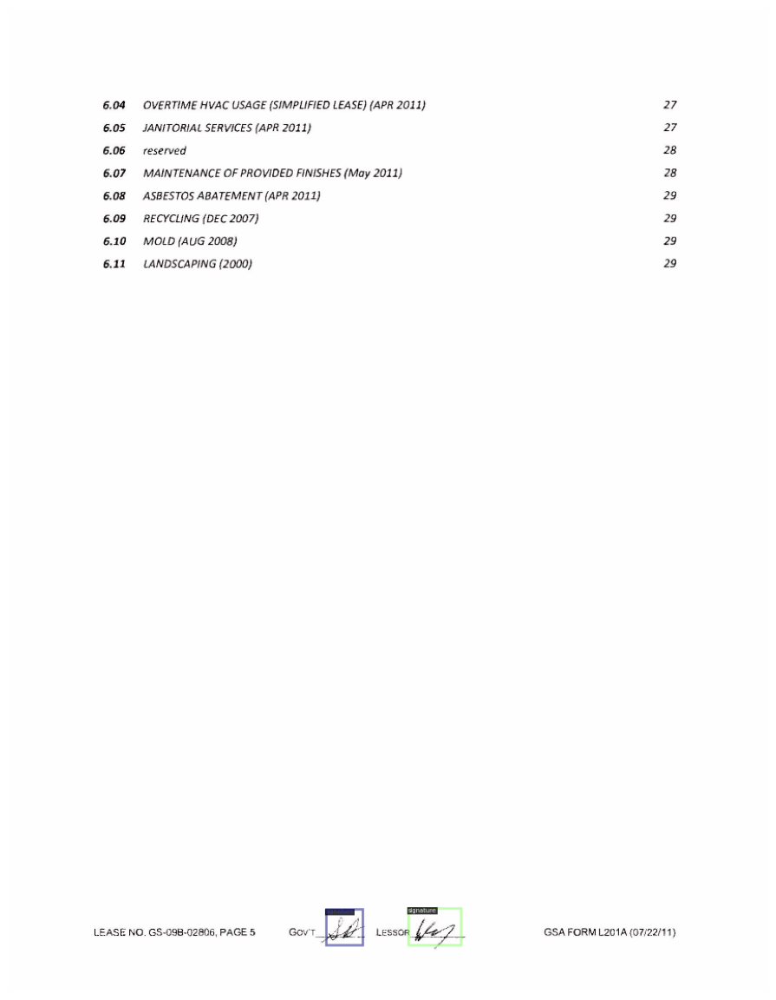

datasets/JPEGImages/a3d4633b-ff0e-4461-8139-917a6c226ffa-1.jpg


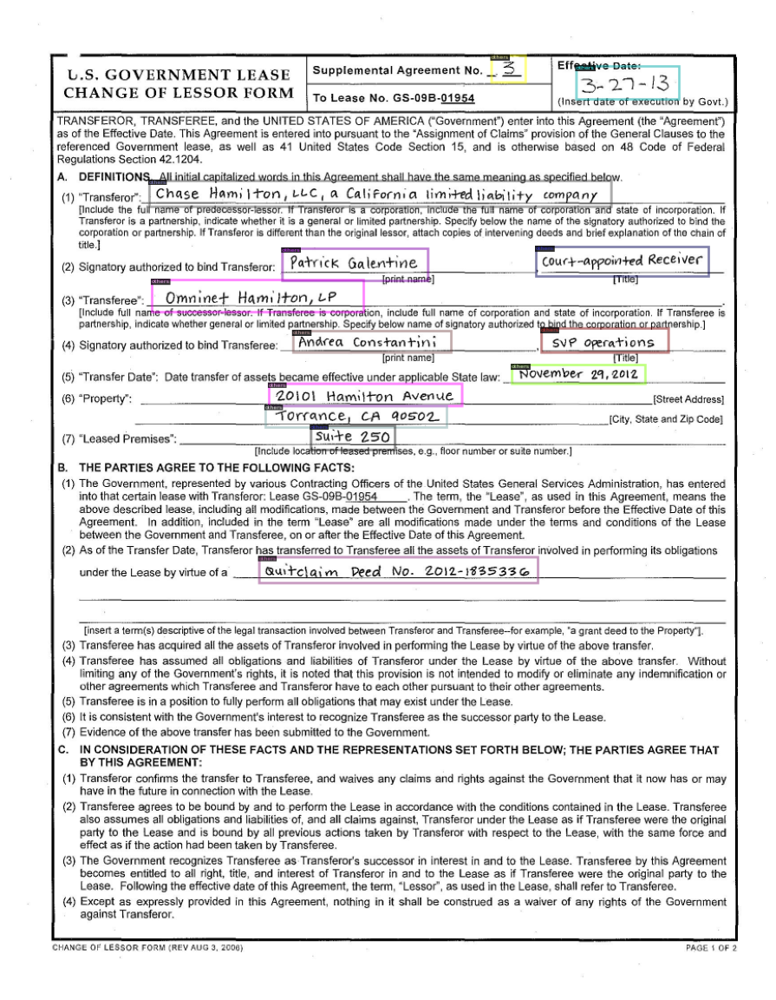

datasets/JPEGImages/58dc6da3-295d-4d08-8587-217a618c000b-1.jpg


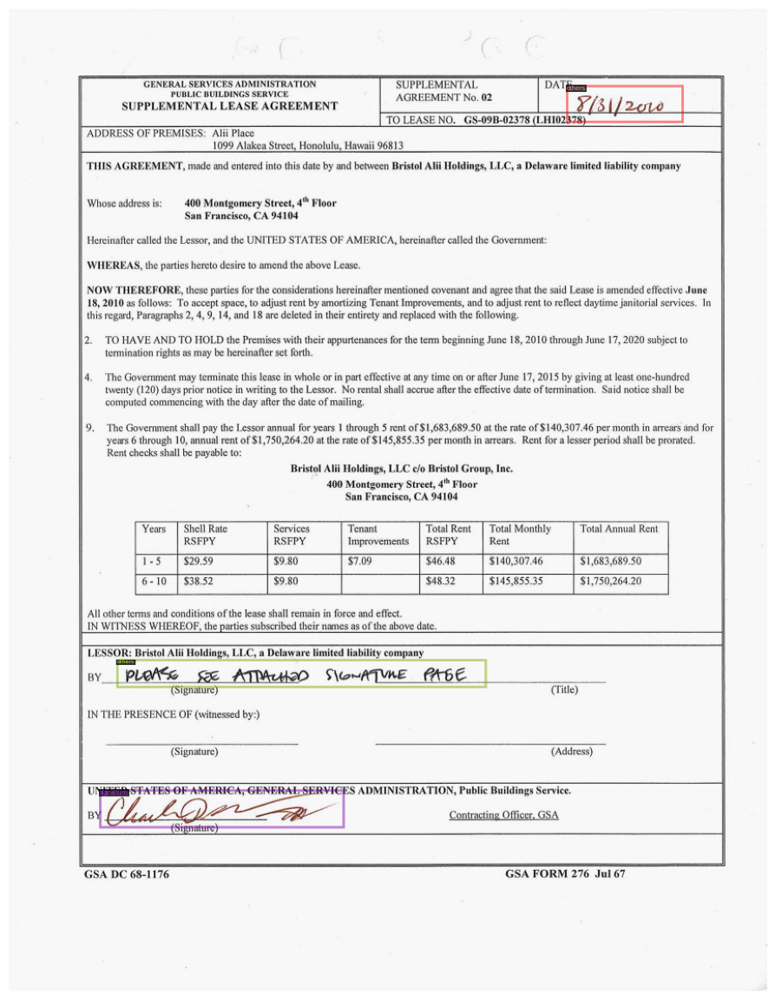

datasets/JPEGImages/9854ded9-3bd7-437c-83c4-b05d409c5872-5.jpg


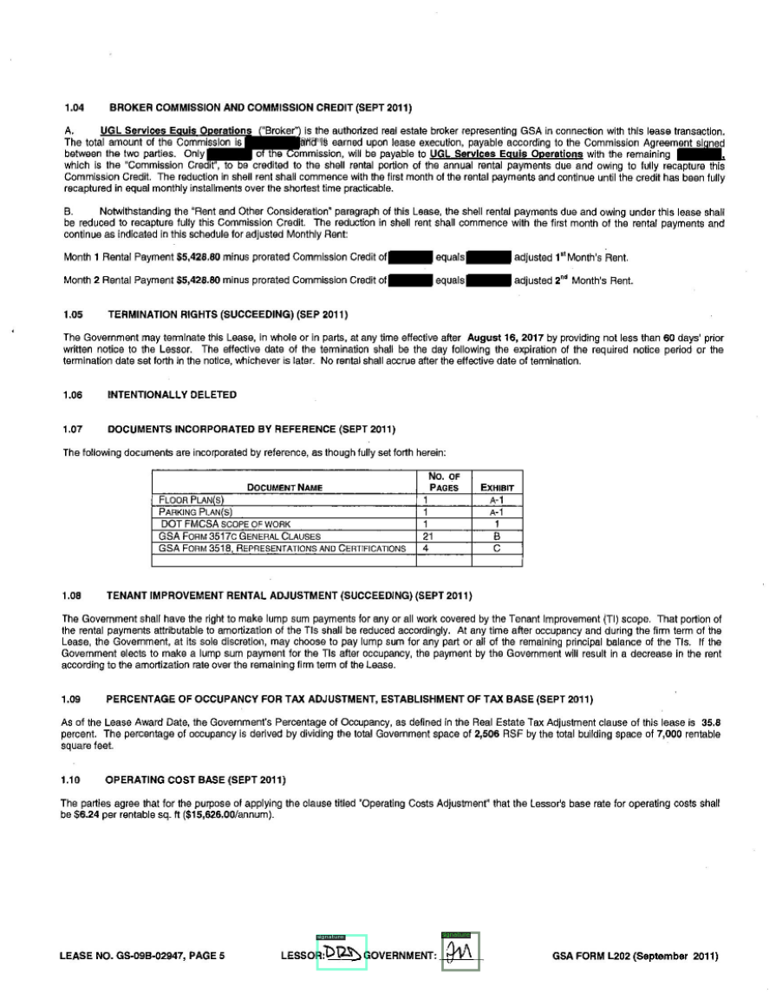

In [7]:
visualize_dataset('signature_dataset_train',n_samples = 4)

## 2. Model Training


In [11]:
!wget https://dl.fbaipublicfiles.com/detectron2/ImageNetPretrained/MSRA/R-101.pkl

--2021-12-01 16:24:20--  https://dl.fbaipublicfiles.com/detectron2/ImageNetPretrained/MSRA/R-101.pkl
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 104.22.75.142, 172.67.9.4, 104.22.74.142, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|104.22.75.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 178666803 (170M) [application/octet-stream]
Saving to: ‘R-101.pkl’

R-101.pkl           100%[===================>] 170.39M  26.6MB/s    in 6.9s    

2021-12-01 16:24:28 (24.6 MB/s) - ‘R-101.pkl’ saved [178666803/178666803]



In [25]:
from detectron2.engine import default_argument_parser
from detectron2.engine import DefaultTrainer
from detectron2.engine import default_setup
from detectron2.config import get_cfg


def setup_cfg(args):
    """
    Create configs and perform basic setups.
    """
    cfg = get_cfg()
    cfg.merge_from_file(args.config_file)
    cfg.merge_from_list(args.opts)
    cfg.freeze()
    default_setup(cfg, args)
    return cfg


parser = default_argument_parser() 
args = parser.parse_args("--config-file /content/Handwritten-text-Detection-Detectron2/configs/sign_faster_rcnn_R_101_FPN_3x.yaml OUTPUT_DIR sign_model MODEL.WEIGHTS /content/R-101.pkl SOLVER.MAX_ITER 2000".split())

We have copied the config file for Faster RCNN R50 FPN from the [model zoo](https://github.com/facebookresearch/detectron2/blob/master/configs/COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml) as sign_faster_rcnn_R_50_FPN_3x.yaml and updated the configuration parameters. 

We have set the <mark>MODEL.ROI_HEADS</mark>(classes) to 2, Max Number of iterations to 4000, and training dataset name to the one we registered earlier.

config.setup_cfg function will load the configuration from the --config-file path, and will update the configration with other parameters passed as arguments

Here, we have passed the OUTPUT_DIR parameter to update the cfg.OUTPUT_DIR parameter value

In [26]:
cfg = setup_cfg(args)

[12/01 16:35:11 detectron2]: Rank of current process: 0. World size: 1
[12/01 16:35:11 detectron2]: Environment info:
----------------------  ---------------------------------------------------------------
sys.platform            linux
Python                  3.7.12 (default, Sep 10 2021, 00:21:48) [GCC 7.5.0]
numpy                   1.19.5
detectron2              0.2.1 @/usr/local/lib/python3.7/dist-packages/detectron2
Compiler                GCC 7.3
CUDA compiler           CUDA 10.0
detectron2 arch flags   sm_35, sm_37, sm_50, sm_52, sm_60, sm_61, sm_70, sm_75
DETECTRON2_ENV_MODULE   <not set>
PyTorch                 1.4.0+cu100 @/usr/local/lib/python3.7/dist-packages/torch
PyTorch debug build     False
GPU available           True
GPU 0                   Tesla K80
CUDA_HOME               /usr/local/cuda
Pillow                  7.1.2
torchvision             0.5.0+cu100 @/usr/local/lib/python3.7/dist-packages/torchvision
torchvision arch flags  sm_35, sm_50, sm_60, sm_70, sm_75
fvcore

Now that we have all the configurations, we can start training the model. 

As I explained earlier, DefaultTrainer will build the model(without weights), optimizer, learning rate scheduler and then load weights from the checkpoint file specified in the cfg.MODEL.WEIGHTS parameter.

In [27]:
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[12/01 16:35:14 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

## 3. Model Prediction

Now that the model has been trained and saved in the output directory. The config saved during the model training has all the parameters except model weight. We pass the model weight path as paramter to load the trained model weight.

The DefaultPredictor does image translation and takes only single image for prediction. But we can easily modify the DefaultPredictor class to accept batch of input images for prediction

In [28]:
from detectron2.engine import default_argument_parser
from detectron2.engine import DefaultPredictor
#import detectron2.config as config

parser = default_argument_parser()
args = parser.parse_args("--config-file sign_model/config.yaml MODEL.WEIGHTS sign_model/model_final.pth".split())
cfg = setup_cfg(args)

predictor = DefaultPredictor(cfg)

[12/01 17:05:15 detectron2]: Rank of current process: 0. World size: 1
[12/01 17:05:15 detectron2]: Environment info:
----------------------  ---------------------------------------------------------------
sys.platform            linux
Python                  3.7.12 (default, Sep 10 2021, 00:21:48) [GCC 7.5.0]
numpy                   1.19.5
detectron2              0.2.1 @/usr/local/lib/python3.7/dist-packages/detectron2
Compiler                GCC 7.3
CUDA compiler           CUDA 10.0
detectron2 arch flags   sm_35, sm_37, sm_50, sm_52, sm_60, sm_61, sm_70, sm_75
DETECTRON2_ENV_MODULE   <not set>
PyTorch                 1.4.0+cu100 @/usr/local/lib/python3.7/dist-packages/torch
PyTorch debug build     False
GPU available           True
GPU 0                   Tesla K80
CUDA_HOME               /usr/local/cuda
Pillow                  7.1.2
torchvision             0.5.0+cu100 @/usr/local/lib/python3.7/dist-packages/torchvision
torchvision arch flags  sm_35, sm_50, sm_60, sm_70, sm_75
fvcore

0.5714669227600098
datasets/JPEGImages/24c13d64-e808-451a-bedd-3a0a170ef002-1.jpg


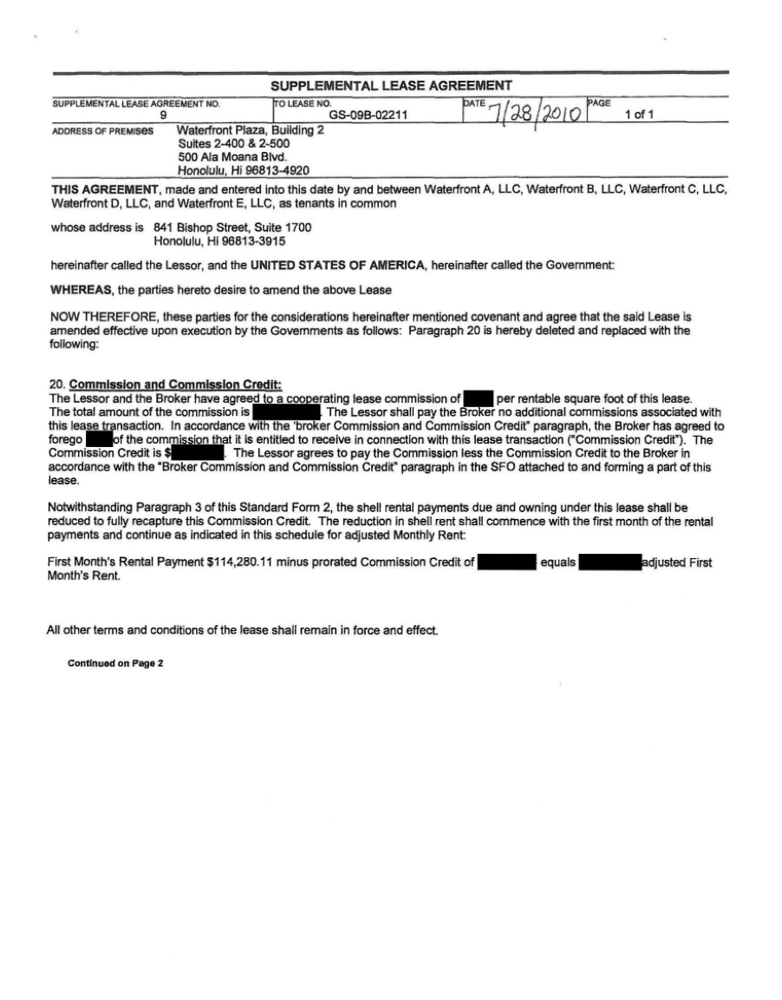

0.5266714096069336
datasets/JPEGImages/30410542-f141-4fed-aa4d-08fbf0c5e3fd-1.jpg


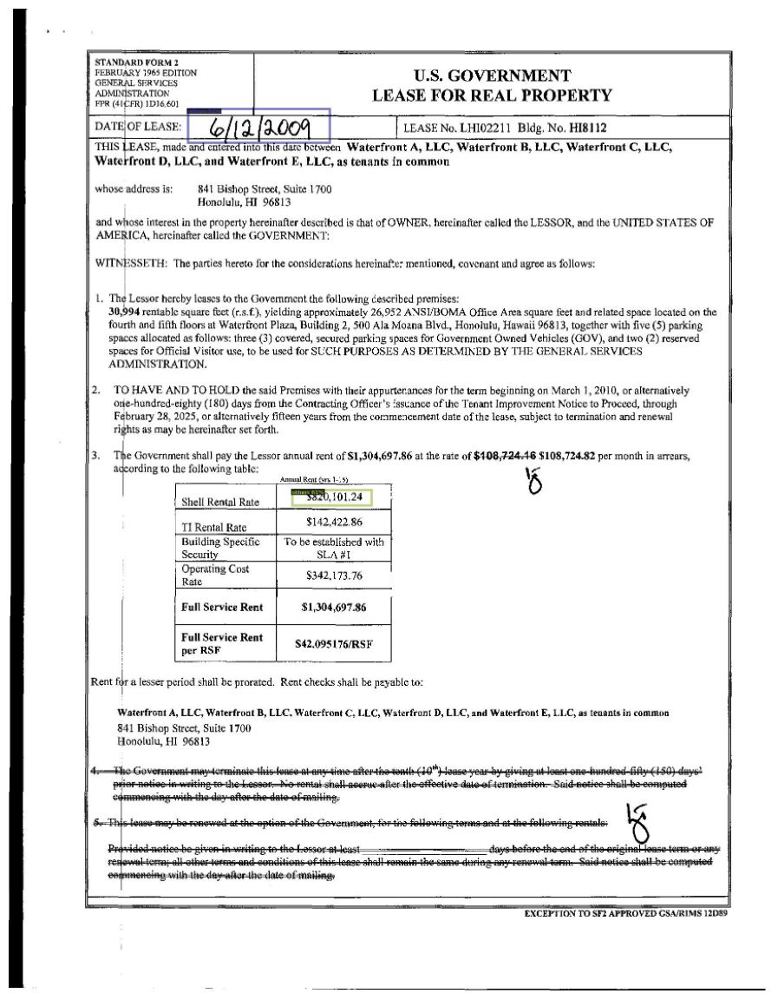

0.49500179290771484
datasets/JPEGImages/2be03311-fe61-494c-a187-fcbf84772330-1.jpg


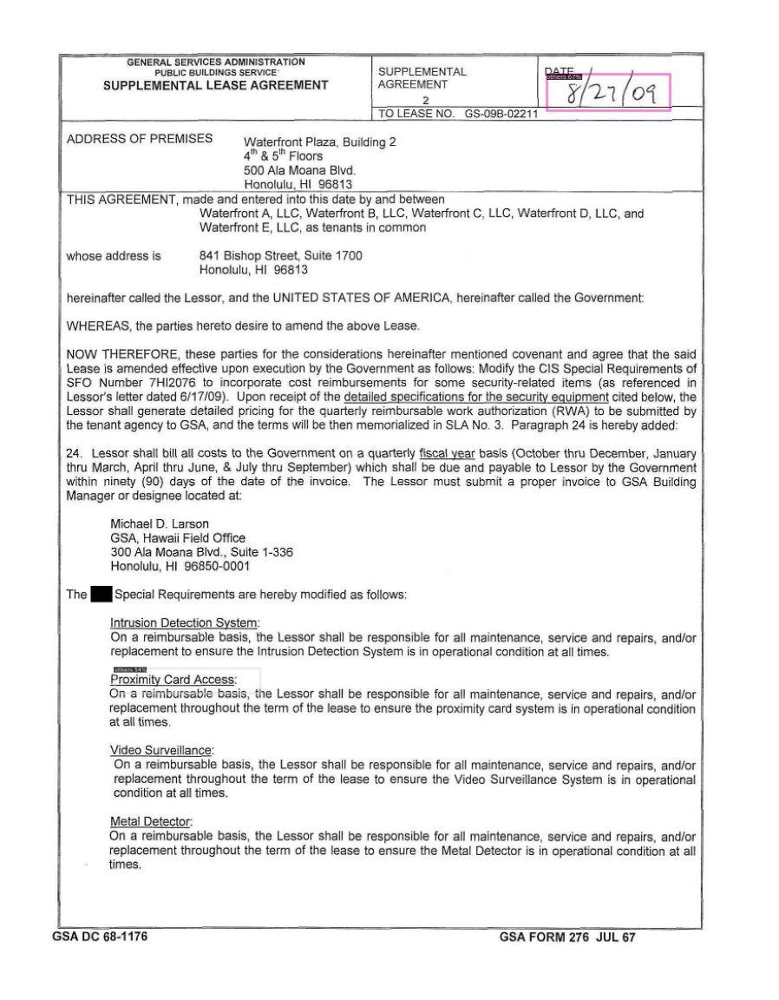

0.4875493049621582
datasets/JPEGImages/07653e58-24d1-4b3f-9b4a-76057efe5c09-1.jpg


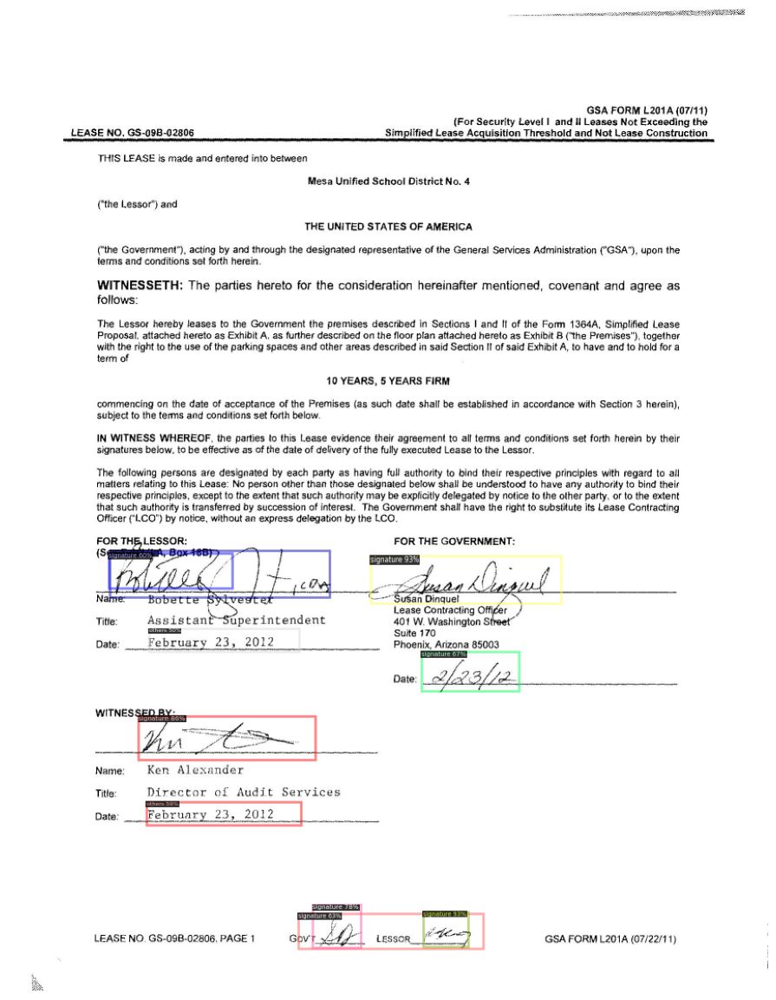

0.4858572483062744
datasets/JPEGImages/924b7e93-1927-4a68-8a1b-a4cc2aa288c6-2.jpg


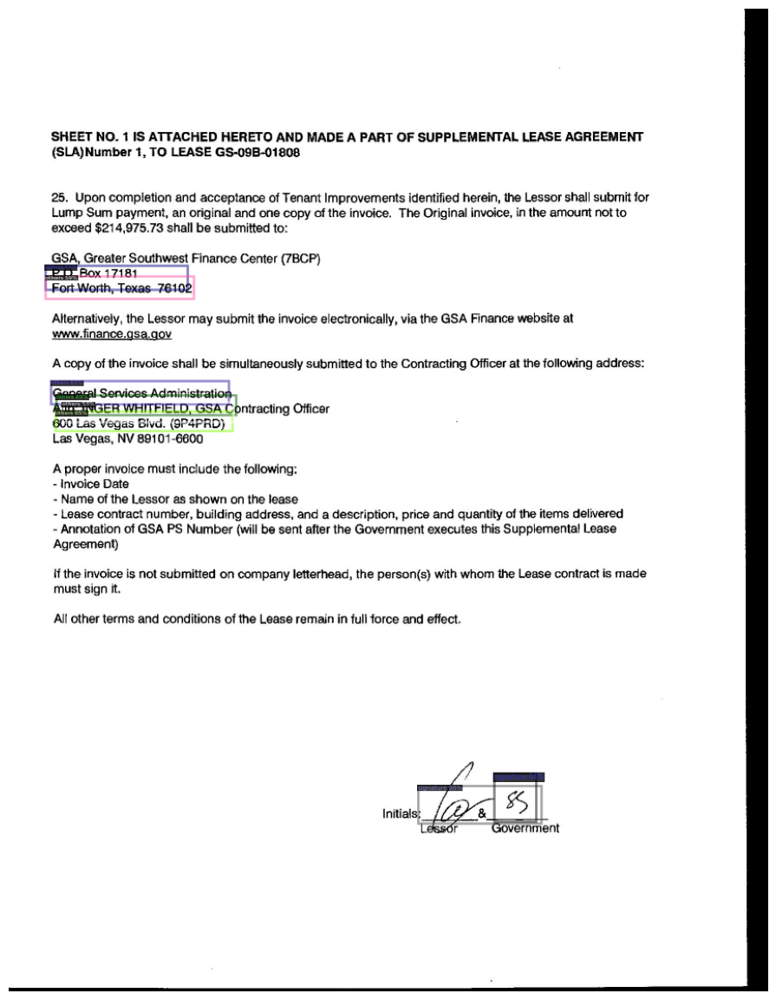

In [29]:
import glob 
import time
import os 

from matplotlib.pyplot import figure
from matplotlib import pyplot as plt
import cv2

from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

files = glob.glob("datasets/JPEGImages/*.jpg")
sample_size = 5
for file,_ in zip(files,range(sample_size)):
    im = cv2.imread(file)
    MetadataCatalog.get("signature_dataset_train").thing_classes = ["signature","others"]
    start_time = time.time()
    outputs = predictor(im)
    print(time.time()- start_time)
    
    v = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get("signature_dataset_train"), scale=0.5)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    print(file)
    figure(num=None, figsize=(15, 15), dpi=100, facecolor='w', edgecolor='k')
    plt.axis("off")
    plt.imshow(v.get_image()[:, :, ::-1])
    plt.show()

## 4. Evaluate

The DefaultTrainer class doesn't have a evaluator method implemented. I have created a new Trainer class and added the build_evaluator method. We could have used this new Trainer class in the first step instead of DefaultTrainer but I wanted to show how easy it is to train the model without writing more code.

In [ ]:
from detectron2.engine import default_argument_parser
import config
import trainer
import dataset_utils

dataset_utils.register_pascal_voc('signature_dataset_train', dirname='datasets', split='train', CLASS_NAMES=["signature","others"])
#dataset_utils.register_pascal_voc('signature_dataset_test', dirname='datasets', split='test', CLASS_NAMES=["signature","others"])
                                  
parser = default_argument_parser()
args = parser.parse_args("--config-file sign_model/config.yaml MODEL.WEIGHTS sign_model/model_final.pth".split())
trainer.eval(args)

OrderedDict([('bbox',
              {'AP': 69.67298193268152,
               'AP50': 98.10585383880746,
               'AP75': 88.13255308840152})])

----------

### Training on a Custom Dataset

Let us say we have got some more annotated dataset which is not in PASCAL VOC xml format. To train the above model, we have write a custom function get_dicts() which returns data in detectron2 format.

To improve the accuracy of handwriting detection, I found one more dataset which is of annotated french documents. The annotations are in json format for each image. The dataset is available in the following github repo
https://github.com/hyperlex/Signature-detection-Practical-guide/tree/master/data/dataset. Download and save it in french_dataset directory

I have added all the functions in the library files dataset_utils.py and trainer.py. We will use these abstractions to quickly train and evaluate new models

In [ ]:
import json 
import glob
import os
import cv2
from detectron2.structures import BoxMode
def get_french_dicts(annot_dir):
    json_files = glob.glob(os.path.join(annot_dir,'*.json'))
    
    dataset_dicts = []
    
    for f in json_files:
        record={}
        img_ann = json.load(open(f))
        
        filename = img_ann['asset']['name']
        height, width = cv2.imread(os.path.join(annot_dir,'..',filename)).shape[:2]
        
        record["file_name"] = os.path.join(annot_dir,'..',filename)
        record["image_id"] = img_ann['asset']['id']
        record["height"] = height
        record["width"] = width
      
        annos = img_ann["regions"]
        objs =[]
        for ann in annos:
            px = ann['boundingBox']['left']
            py = ann['boundingBox']['top']
            px1 = ann['boundingBox']['left'] + ann['boundingBox']['width']
            py1 = ann['boundingBox']['top'] + ann['boundingBox']['height']
            
            obj = {
                "bbox": [px, py, px1, py1],
                "bbox_mode": BoxMode.XYXY_ABS,
                "category_id": {'signature':0,'paraphe':1,'date':1}[ann['tags'][0]],
                "iscrowd": 0
            }
            objs.append(obj)
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

In [ ]:
from detectron2.utils.visualizer import Visualizer
from detectron2.data import DatasetCatalog, MetadataCatalog
import dataset_utils 

def get_img_dicts():
    ann1 = dataset_utils.load_voc_instances(dirname = 'datasets', split = 'train', CLASS_NAMES=["signature","others"])
    ann2 = get_french_dicts('french_dataset/per_img_labels')
    return ann1 + ann2

dataset_name = 'signature_dataset_train'
DatasetCatalog.register(dataset_name, lambda: get_img_dicts())
MetadataCatalog.get(dataset_name).set(thing_classes=["signature","others"], split='train', dirname= dirname, year=2012)

Metadata(name='signature_dataset_train', thing_classes=['signature', 'others'])

In [ ]:
len(DatasetCatalog.get(dataset_name))

139

datasets/JPEGImages/63348ad3-b0cc-45d0-bc85-bf2c865744ec-2.jpg


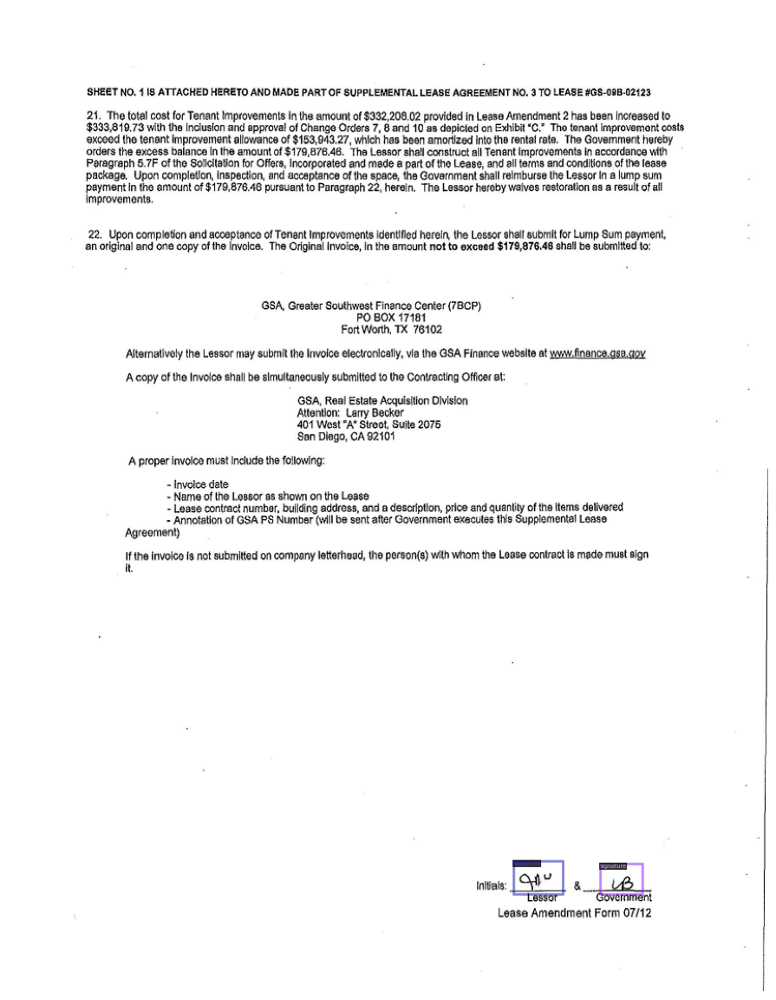

datasets/JPEGImages/4c85bb9b-1d8d-45b0-8f4a-664d77ee4b83-4.jpg


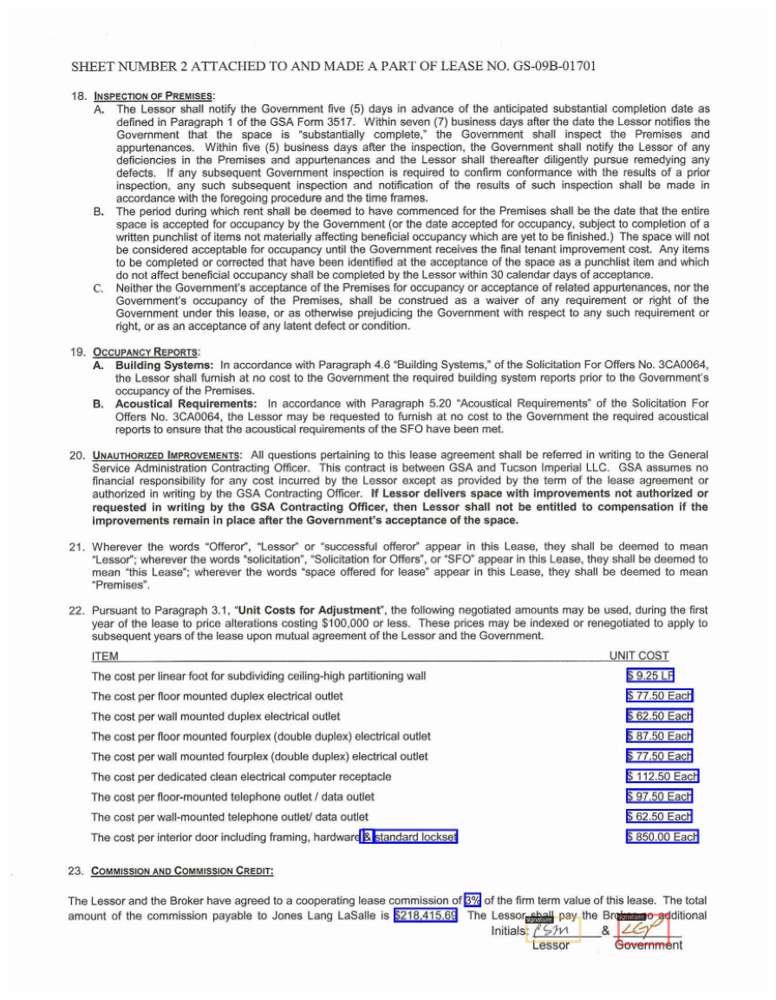

In [ ]:
dataset_utils.visualize_dataset('signature_dataset_train', n_samples=2)

We can run the remaining steps as we did before for training the model and prediction

In [ ]:
from detectron2.engine import default_argument_parser
from detectron2.engine import DefaultTrainer
import trainer

parser = default_argument_parser() 
args = parser.parse_args("--config-file sign_config/chk_faster_rcnn_R_50_FPN_3x.yaml --num-gpus 3 OUTPUT_DIR french_sign_model SOLVER.MAX_ITER 4000".split())
trainer.train(args)

In [ ]:
from detectron2.engine import default_argument_parser
import config
import trainer
import dataset_utils

import dataset_utils

dataset_utils.register_pascal_voc('signature_dataset_test', dirname='datasets', split='train', CLASS_NAMES=["signature","others"])

parser = default_argument_parser()
args = parser.parse_args('--config-file french_sign_model/config.yaml MODEL.WEIGHTS french_sign_model/model_final.pth DATASETS.TEST ("signature_dataset_test",)'.split())
trainer.eval(args)

OrderedDict([('bbox',
              {'AP': 67.82590895115814,
               'AP50': 96.77629667360196,
               'AP75': 84.18387912626437})])

The Average Precision has reduced compared to the previous model. Let us check the prediction results.

In [ ]:
from detectron2.engine import default_argument_parser
from detectron2.engine import DefaultPredictor
import config

parser = default_argument_parser()
args = parser.parse_args("--config-file french_sign_model/config.yaml MODEL.WEIGHTS french_sign_model/model_final.pth".split())
cfg = config.setup_cfg(args)

predictor = DefaultPredictor(cfg)

0.4847722053527832
test_images/image_11.jpg


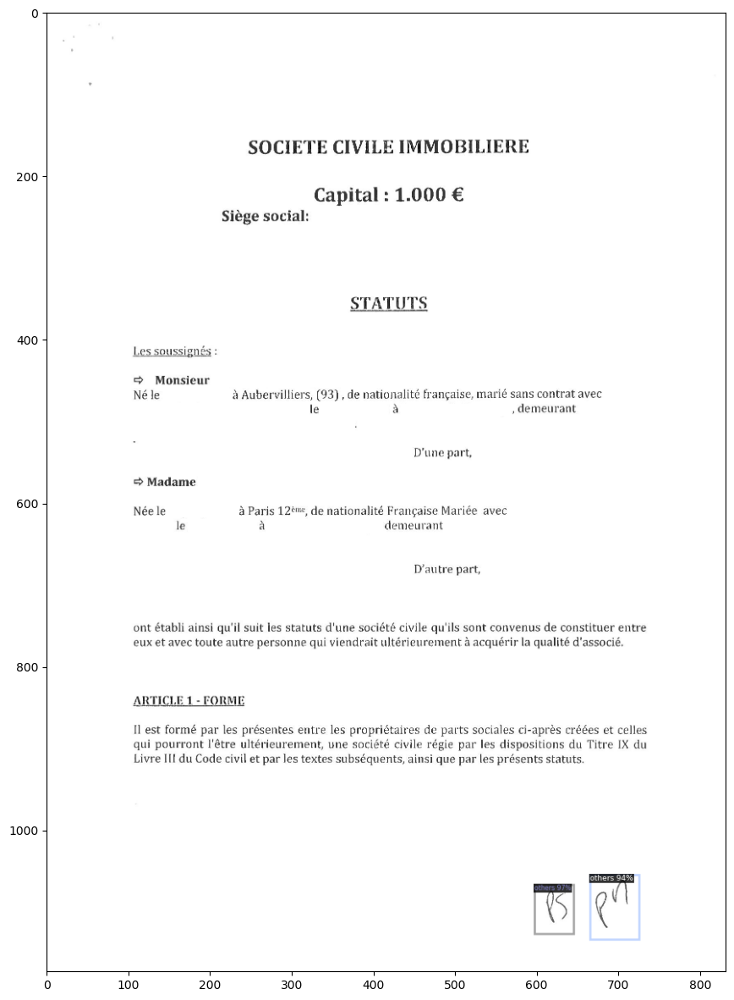

0.18241333961486816
test_images/0d0eddfc-731b-44de-b84d-d265afc7d996-1.jpg


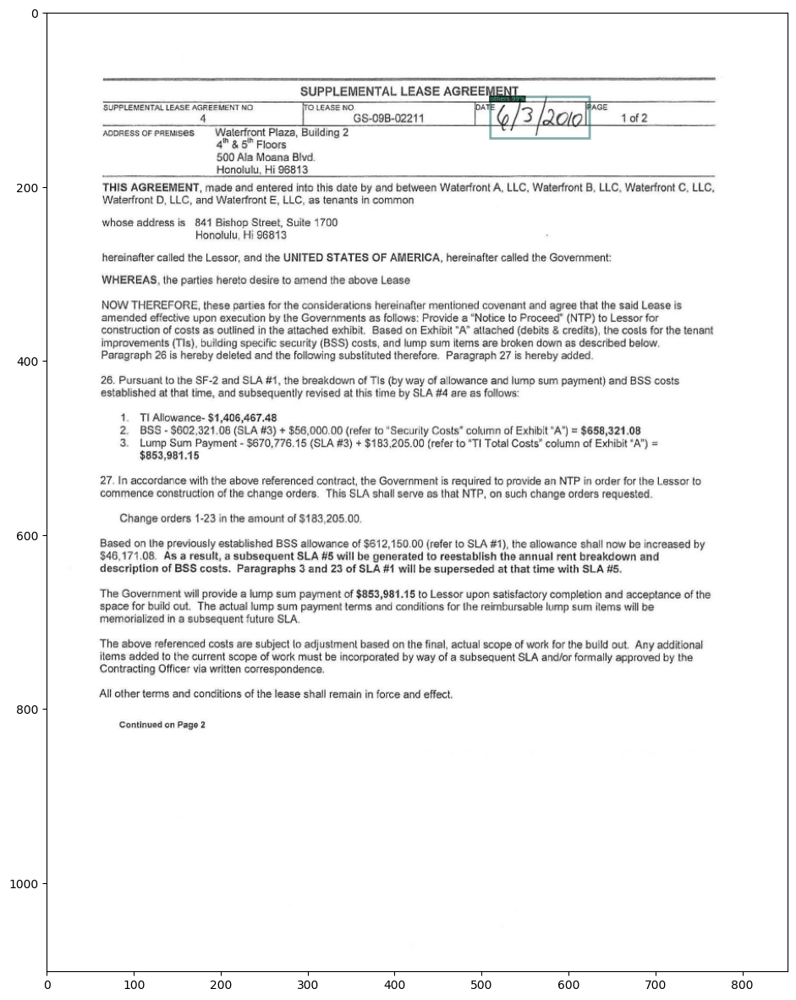

0.17200803756713867
test_images/07653e58-24d1-4b3f-9b4a-76057efe5c09-6.jpg


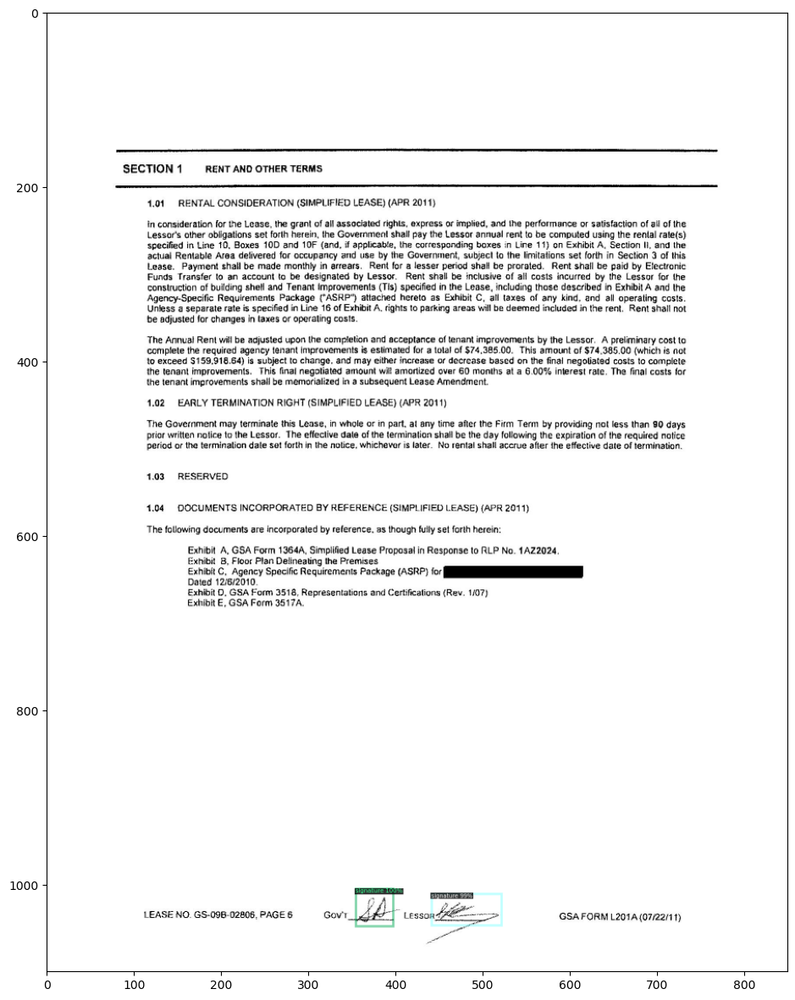

0.18814849853515625
test_images/0d0eddfc-731b-44de-b84d-d265afc7d996-2.jpg


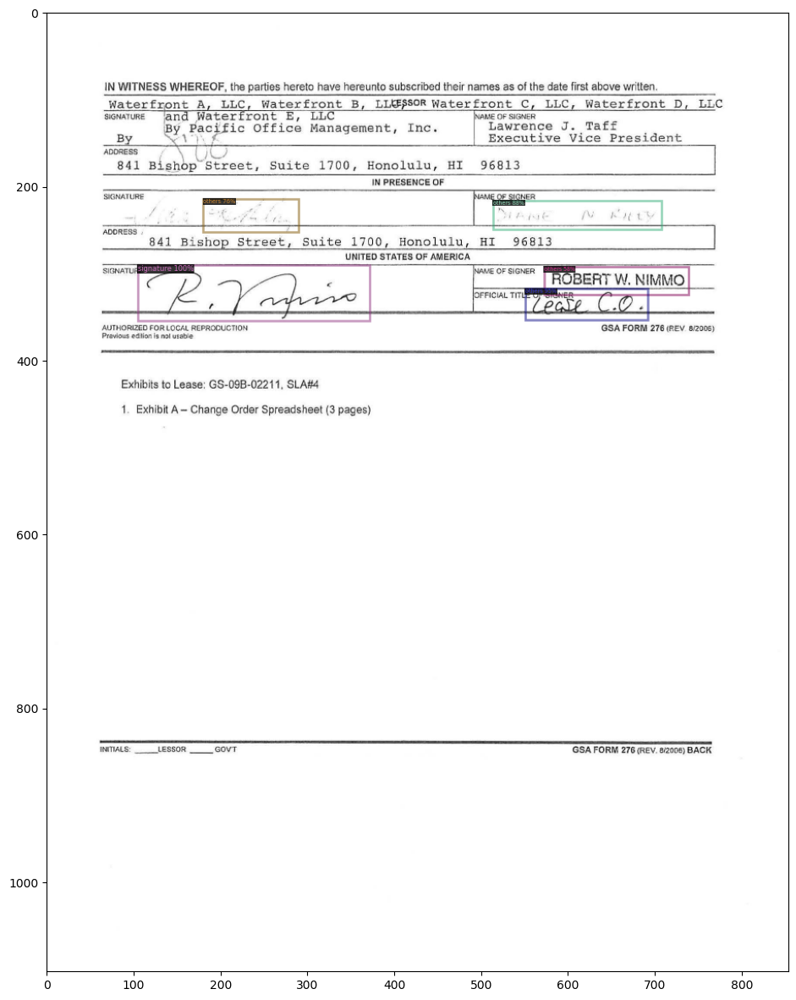

0.19216012954711914
test_images/image_10.jpg


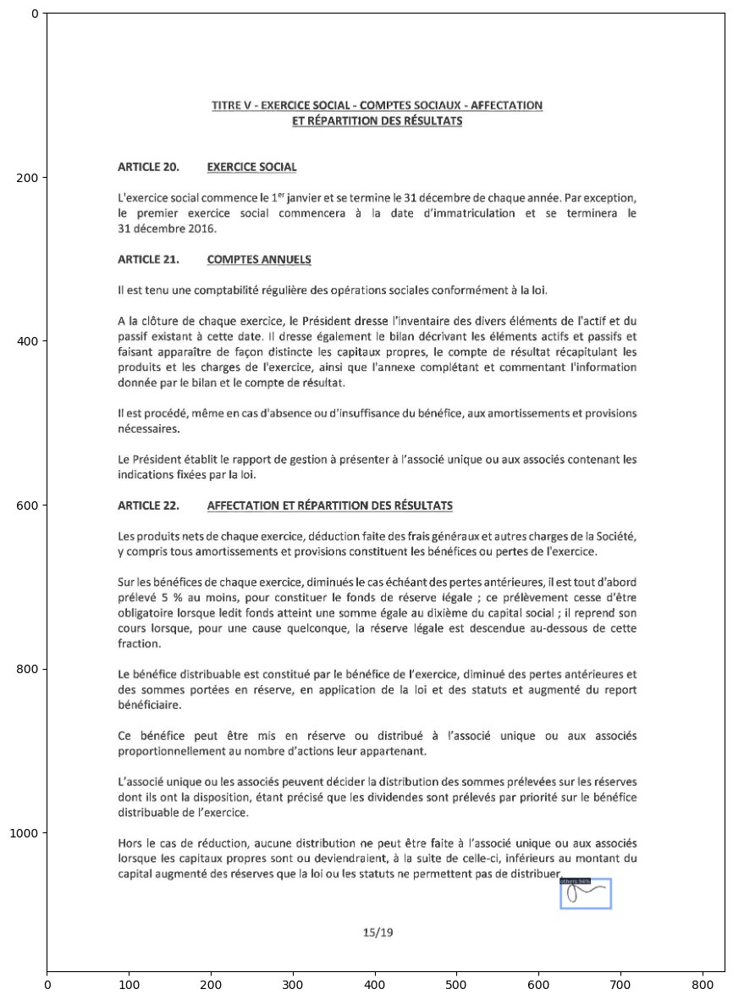

In [ ]:
import glob 
import time
import os 

from matplotlib.pyplot import figure
from matplotlib import pyplot as plt
import cv2

from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

files = glob.glob("test_images/*.jpg")
sample_size = 5
for file,_ in zip(files,range(sample_size)):
    im = cv2.imread(file)
    MetadataCatalog.get("signature_dataset_train").thing_classes = ["signature","others"]
    start_time = time.time()
    outputs = predictor(im)
    print(time.time()- start_time)
    
    v = Visualizer(im[:, :, ::-1], metadata=MetadataCatalog.get("signature_dataset_train"), scale=0.5)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    print(file)
    figure(num=None, figsize=(15, 15), dpi=100, facecolor='w', edgecolor='k')
    plt.imshow(v.get_image()[:, :, ::-1])
    plt.show()